# Lecture VII

Modelling and Machine Learning of Dynamical Systems in Julia


In [21]:
import Pkg 
Pkg.activate(;temp=true)
Pkg.add(["SpeedyWeather", "DynamicalSystems", "OrdinaryDiffEq", "Plots"])
using SpeedyWeather, DynamicalSystems, OrdinaryDiffEq, Plots

  Activating new project at `/var/folders/vh/kv_4zdr96jz7s12j89cjcl780000gn/T/jl_lTlnIw`
   Resolving package versions...
    Updating `/private/var/folders/vh/kv_4zdr96jz7s12j89cjcl780000gn/T/jl_lTlnIw/Project.toml`
  [61744808] + DynamicalSystems v3.4.1
  [1dea7af3] + OrdinaryDiffEq v6.98.0
  [91a5bcdd] + Plots v1.40.14
  [9e226e20] + SpeedyWeather v0.15.0
    Updating `/private/var/folders/vh/kv_4zdr96jz7s12j89cjcl780000gn/T/jl_lTlnIw/Manifest.toml`
  [47edcb42] + ADTypes v1.14.0
  [621f4979] + AbstractFFTs v1.5.0
  [1520ce14] + AbstractTrees v0.4.5
  [7d9f7c33] + Accessors v0.1.42
  [79e6a3ab] + Adapt v4.3.0
  [66dad0bd] + AliasTables v1.1.3
  [ec485272] + ArnoldiMethod v0.4.0
  [4fba245c] + ArrayInterface v7.19.0
  [4c555306] + ArrayLayouts v1.11.1
  [2119f1ac] + AssociatedLegendrePolynomials v1.0.1
  [a9b6321e] + Atomix v1.1.1
  [f3fd9213] + Attractors v1.26.4
  [13072b0f] + AxisAlgorithms v1.1.0
  [d1d4a3ce] + BitFlags v0.1.9
  [de688a37] + BitInformation v0.6.3
  [62783981] + B

  [05823500] + OpenLibm_jll v0.8.1+0
  [bea87d4a] + SuiteSparse_jll v5.10.1+6
  [83775a58] + Zlib_jll v1.2.13+0
  [8e850b90] + libblastrampoline_jll v5.8.0+0
  [8e850ede] + nghttp2_jll v1.48.0+0
  [3f19e933] + p7zip_jll v17.4.0+0
        Info Packages marked with ⌅ have new versions available but compatibility constraints restrict them from upgrading. To see why use `status --outdated -m`
   Resolving package versions...
    Updating `/private/var/folders/vh/kv_4zdr96jz7s12j89cjcl780000gn/T/jl_mM2FM4/Project.toml`
  [61744808] + DynamicalSystems v3.2.3
    Updating `/private/var/folders/vh/kv_4zdr96jz7s12j89cjcl780000gn/T/jl_mM2FM4/Manifest.toml`
  [621f4979] + AbstractFFTs v1.5.0
⌃ [f3fd9213] + Attractors v1.7.1
  [13072b0f] + AxisAlgorithms v1.0.1
  [96374032] + CRlibm v1.0.1
  [d360d2e6] + ChainRulesCore v1.18.0
  [608a59af] + ChaosTools v3.1.2
  [aaaa29a8] + Clustering v0.15.5
  [35d6a980] + ColorSchemes v3.24.0
  [3da002f7] + ColorTypes v0.11.4
  [c3611d14] + ColorVectorSpace v0.1

# Climate Models (Part I)

## Contents 

* A very brief introduction into climate modelling 
* SpeedyWeather.jl: atmospheric modelling 
* Julia/Programming: CICD 

## Climate Modelling 

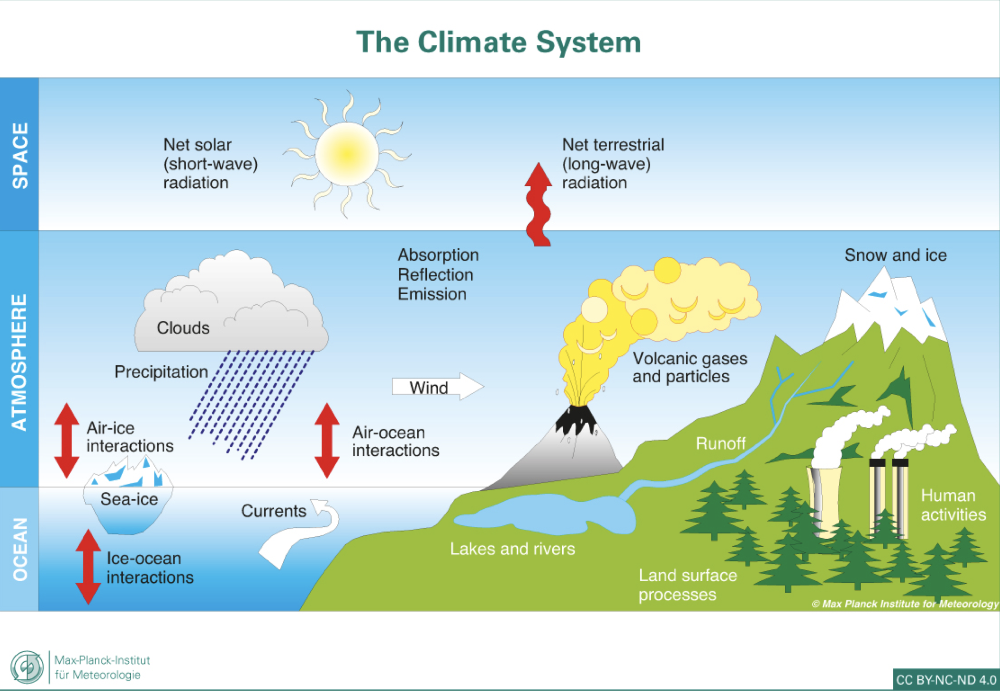

* Climate models are large comprehensive models 
* The are made up of many submodels, each often comprising another set of submodels that are all coupled together in the end



## Components of Climate Models 

### Atmosphere 

* Navier-Stokes equation: $$\frac{\partial}{\partial t}(\rho\mathbf{u}) + \nabla\cdot\left(\rho\mathbf{u}\mathbf{u}^T\right) = -\nabla p + \nabla\cdot\tau + \rho\mathbf{g}$$
* with: $\mathbf{u}$ velocity field, $\rho$ density, $\nabla=\left(\frac{\partial}{\partial x},\frac{\partial}{\partial y},\frac{\partial}{\partial z}\right)$ nabla operator (spatial derivatives), $p$ pressure, $\tau$ stress tensor, $g$ body accelarations (e.g. gravity)
* The Navier-Stokes equations is very hard to solve, usually some approximations are needed 

#### Rayleigh-Benard Convection: Lorenz 63 Model 

* We've seen one approximation a few lectures ago, the Lorenz 63 model for the Rayleigh-Benard Convection

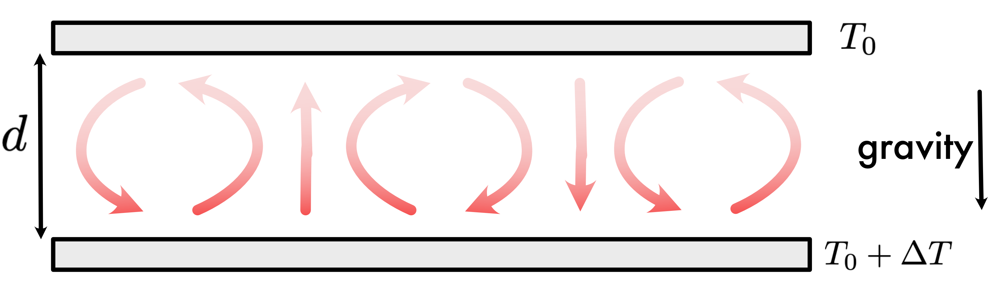

* We've seen that a very coarse approximation for the streamfunction $\mathbf{u} = \nabla\psi$ and temperature profile $\theta$ is given by 

$$\begin{align}\theta(x,z,t) &= \frac{R_c \delta T}{\pi R}\left(\sqrt{2}Y(t)\cos(\pi x/l)\sin(\pi z/d) - Z(t)\sin(2 \pi z/d)\right)\\
\psi(x,z,t) &= \frac{1 - (d/l)^2\kappa}{d/l}\sqrt{2}X(t)\sin(\pi x/l)\sin(\pi z/d)\end{align}$$

where the temporal evolution follows: 

$$\begin{align}\frac{dX}{dt} &= -\sigma X + \sigma Y \\
\frac{dY}{dt} &= -XZ + rX - Y \\
\frac{dZ}{dt} &= XY - bZ\end{align}$$

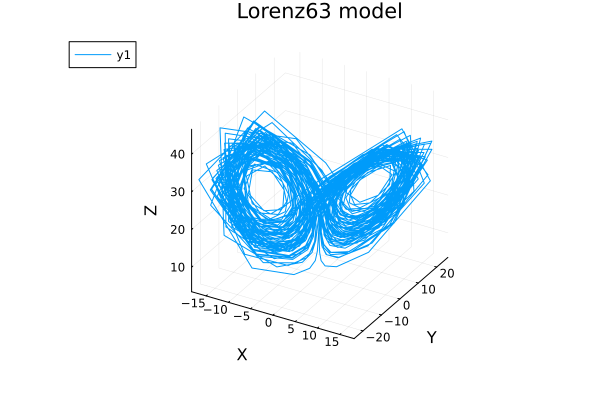

In [26]:
using DynamicalSystems, Plots
ds = DynamicalSystems.Systems.lorenz();
tr = Matrix(trajectory(ds,100.,Ttr=50.)[1]);
plot(tr[:,1],tr[:,2],tr[:,3], xlabel="X",ylabel="Y",zlabel="Z",title="Lorenz63 model")

* We've seen that this is a chaotic system with a strong sensitivity to changes of its initial condition


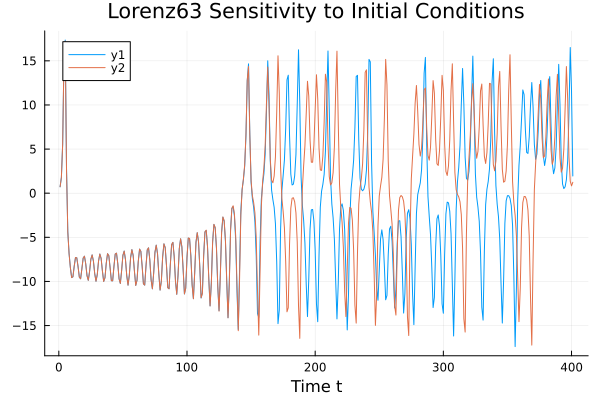

In [23]:
u0=rand(3)
tr = Matrix(trajectory(Systems.lorenz(u0),40.,Ttr=0.)[1]);
tr2 = Matrix(trajectory(Systems.lorenz(u0 .+ 0.01),40.,Ttr=0.)[1]);
plot(tr[:,1])
plot!(tr2[:,1], title="Lorenz63 Sensitivity to Initial Conditions", xlabel="Time t")

* This is true for all (meaningful) approximations to the Navier-Stokes approximation 
* Meteorology deals with these approximations in a systematic manner
* One very common approximation is the *shallow water approximation* and the *primitive equation model*
    * The Navier-Stokes equation formulated in spherical coordinates, for which the height of the atmosphere is seen small against Earth's radius and thus some derivative with respect to the radius are neglected  
* Other approximations often stem from a scale analysis of the equation, only keeping terms that are responsible for large-scale motions
    * These are e.g. *geostrophic* and *quasi-geostrophic* approximations

## Ocean 

* Navier-Stokes equation: $$\frac{\partial}{\partial t}(\rho\mathbf{u}) + \nabla\cdot\left(\rho\mathbf{u}\mathbf{u}^T\right) = -\nabla p + \nabla\cdot\tau + \rho\mathbf{g}$$
* The different fluid leads to slightly different results for the scale analysis but overall a similar approach as for the atmosphere
* In contrast to the atmosphere, ocean models have to deal with boundary conditions, which is why the discretization schemes can look different as well 

## Ice Sheets & Sea Ice 

* Based on thermodynamics and mechanics for the ice stress / deformation 

## Vegetation Models 

* More empirical models how vegetation reacts to climate (e.g. precipitation) and how it affects the local (and global) climate

## Submodels 

* Each of these has additionally usually several submodels, e.g. a fire model of a vegetation model or a cloud resolving model for the atmosphere
* All models and submodels are coupled together
* Coupling parameters are found partially by knowledge, partially by fitting the model to past observations

## Weather vs. Climate 

* Weather is a short-term condition/state, e.g. the temperature/precipition at a specific place and date
    * The forecast of a single trajectory of a system 
    * The forecast is limited by the chaotic nature of the system
* Climate are long-term averages 
    * The position and shape of the attractor 
* In practice numerical weather prediction models and climate models are very similar 
* Numerical weather prediction can run at higher resolutions and with some more processes modelled as only short trajectories are needed
* Climate models have integrate trajectories for a few decades at least, thus they need to run faster

## Energy Balance Models (EBMs)

* Highly simplified models that determine the temperatur of the surface of the Earth by considering the balance of in- and outgoing radition, i.e. energy

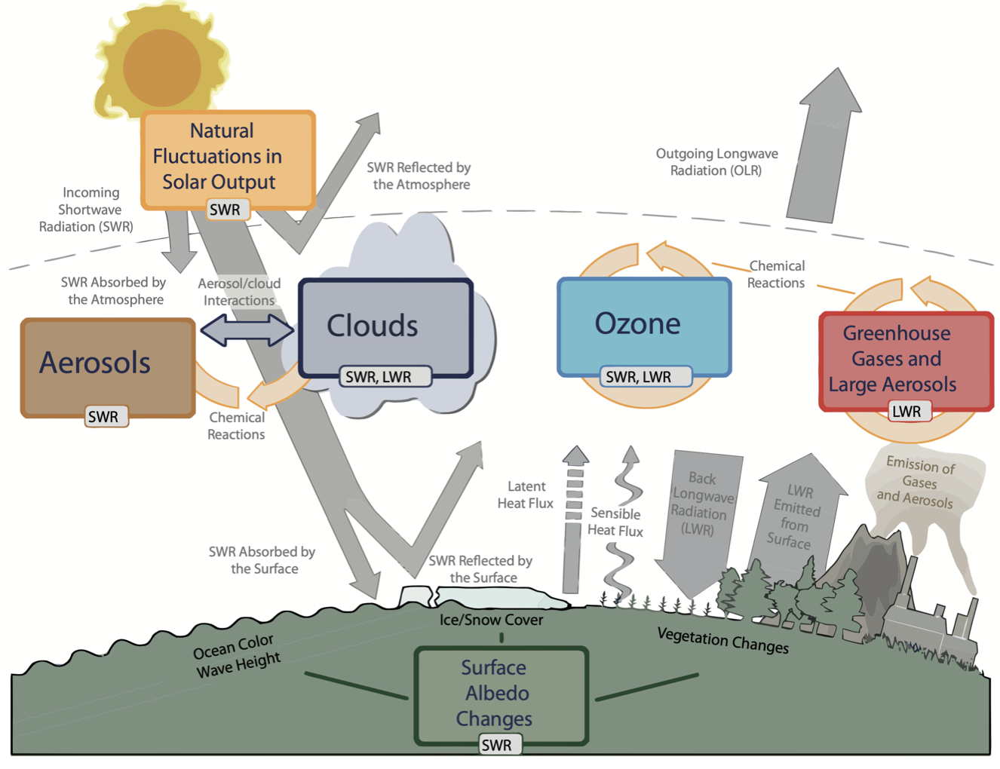 (Figure IPCC AR5)

### Zero-Dimensional EBMs 

* The average surface temperature $T$ is approximately in an equilibrium. It is changing slowly due to natural variability and anthropogenic climate change but these are long-term effects, that we will neglect for our very course models
* For an equilibrium, we have to find fixed points of the model: 

$$\begin{align} 
\frac{dE}{dt} &= E_{in}(T) - E_{out}(T)\\
0 &= E_{in}(T) - E_{out}(T)
\end{align}$$

$$\frac{dE}{dt} = (1 - \alpha)\frac{\pi r^2}{4\pi r^2} S_0 - \sigma T^4$$


* $\alpha$ is the albedo, so reflectivity of the surface, $\alpha=1$ means all raditation is reflected, for $\alpha=0$ all is absorbed, Earth's average albedo is $\approx0.3$
* $\frac{\pi r^2}{4\pi r^2}$ is the ratio of cross-section to surface of a sphere
    * this is present as the Earth emmits radiation over its complete surface but only receives radition on one side
* $S_0$ is the solar constant $1363 Wm^{-2}$
* $\sigma T^4$ is the outgoing black body radition according the Stefan Boltzmann law, with the Boltzmann constant $5.67\cdot10^{-8}Wm^{-2}K^{-4}$


### Albedo of Typical Surfaces 
<div><img src='https://en.wikipedia.org/wiki/Albedo#/media/File:Albedo-e_hg.svg' width='300'></div>

(Figure CC BY-SA 2.5, Wikipedia, won't work in the html version, here's a [link]( https://en.wikipedia.org/wiki/Albedo#/media/File:Albedo-e_hg.svg)

* _Ice-albedo feedback_ - is an example of a positive feedback loop: higher temperatures lead to less snowy and icy surfaces which lead to decrease in albedo which lead to a further increase in temperature


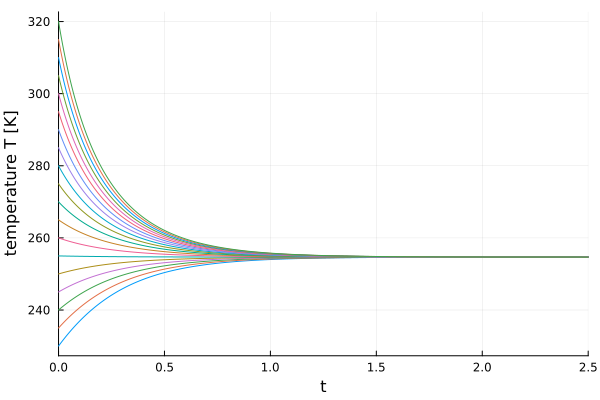

In [27]:
using OrdinaryDiffEq, Plots

function zero_d_ebm(u,p,t) 
    α, S₀, σ = p 
    return (1 - α)*(S₀/4) - σ*u[1]^4
end 

p = [0.3, 1363, 5.67e-8]
u0 = [273.]
prob = ODEProblem(zero_d_ebm, u0, (0.,2.5),p)
u0s = 230:5:320

fig = plot(0,0,xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=u0)),label=nothing)
end 
fig

* Analytically, we would also find that the fixed point of the system is at $254.7K$:

$$\begin{align}
\sigma T_*^4 &= (1-\alpha)S_0/4\\
       T_*   &= \left(\frac{(1-\alpha)S_0}{4\sigma}\right)^{1/4}
\qquad\text{with}\quad f'(T_*) = -3\sigma T_*^4 < 0\end{align}
$$

#### 0D-EBM with Greenhouse Gases

* That's a too cold because we have not considered the effect of greenhouse gases. 
* The Earth is not a perfect black body: some of the outgoing longwave radiation is absorbed by the athmosphere and/or reflected back by water vapor and CO2
* The simplest ansatz is just to reduce the outgoing radiation by fraction $\varepsilon$, so that with $\varepsilon=0.6$:

$$\begin{align} \frac{dE}{dt} &= (1 - \alpha)\frac{S_0}{4}  - \varepsilon\sigma T^4\\
 T_*   &= \left(\frac{(1-\alpha)S_0}{4\varepsilon\sigma}\right)^{1/4}
\qquad\text{with}\quad f'(T_*) = -3\varepsilon\sigma T_*^4 < 0\end{align}$$


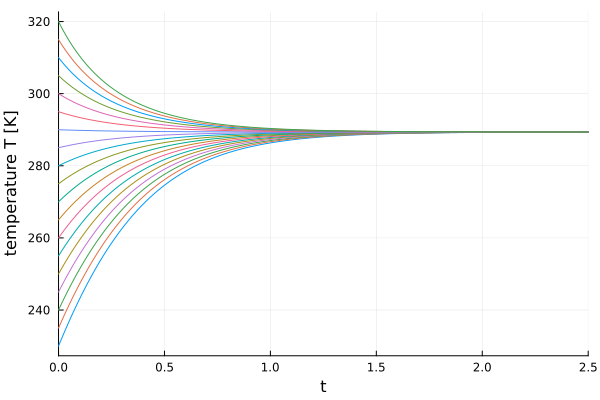

In [9]:
function zero_d_ebm_greenhouse_epsilon(u,p,t) 
    α, S₀, σ, ϵ = p 
    return (1 - α)*(S₀/4) - ϵ*σ*u[1]^4
end 
p = [0.3, 1363, 5.67e-8, 0.6]
u0 = [273.]
prob = ODEProblem(zero_d_ebm_greenhouse_epsilon, u0, (0.,2.5),p)
u0s = 230:5:320

fig = plot(0,0, xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=u0)),label=nothing)
end 
fig

* Now, this has a equilibrium temperature of $T_* = 289K$ which is about the average surface temperature of the Earth. 

### Budyko's Linear OLR Approach

* Another approach was chosen by [Budyko, 1969](https://onlinelibrary.wiley.com/doi/10.1111/j.2153-3490.1969.tb00466.x)
* Temperature only varies within a small margin, so we write $T = T_0 + T_C$, where $T_C$ is temperature in Celcius and $T_0\approx273K$
* OLR = Outgoing Longwave Radiation 

$$\begin{align} 
            OLR &= \varepsilon\sigma T^4 \\
            OLR &= \varepsilon\sigma (T_0 + T_C)^4 = \varepsilon\sigma T_0 (1 + T_C/T_0)^4\\
        \text{for $T_C/T_0<<1$}\qquad &\approx \varepsilon\sigma T_0 ( 1 + 4T_C/T_0)\\
        &\approx A + B T_C
\end{align}$$

(The approximation is the first term in a binomial expansion)

Budyko was using $A = 202 Wm^{-2}$ and $B = 1.45 W m^{-2} C^{-1}$, estimated from observation data. 

You can test this EBM in the exercise.



### Zero-dimensional EBM with Temperature Dependent Albedo

* Another effect that we haven't considered is that the albedo varies with temperature $\alpha=\alpha(T)$
* Ice-albedo feedback: higher temperatures lead to less snowy and icy surfaces which lead to decrease in albedo which lead to a further increase in temperature
* So, the albedo should decrease with increasing temperature, but the albedo is bound, snow has a albedo of around 0.7, regular soil 0.3
* A good ansatz is modelling it with a $\tanh$

$$\alpha(T) = \alpha_0 - \frac{\alpha_1}{2} (\tanh(T - \hat{T}))$$

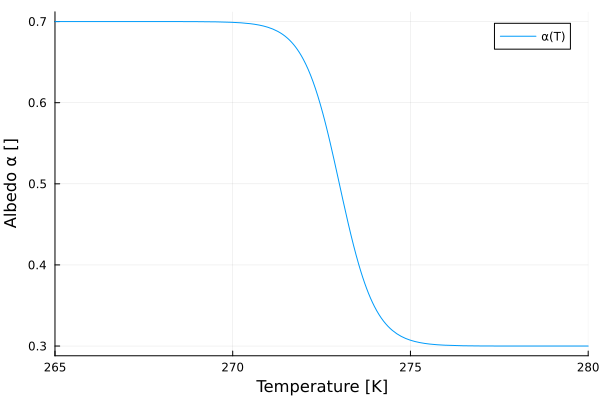

In [10]:
α(T; α₀=0.5, α₁=0.4, T̂=273) = α₀ - (α₁/2)*tanh(T - T̂)
plot(α, xlims=[265,280], xlabel="Temperature [K]", ylabel="Albedo α []", label="α(T)")

* Let's plug that into the EBM 

$$\frac{dE}{dt} = (1 - \alpha_0 + \frac{\alpha_1}{2} (\tanh(T - \hat{T})))\frac{S_0}{4} - \varepsilon\sigma T^4$$

* This leads to some more interesting dynamics, we can see that there are now two fixed points in the system

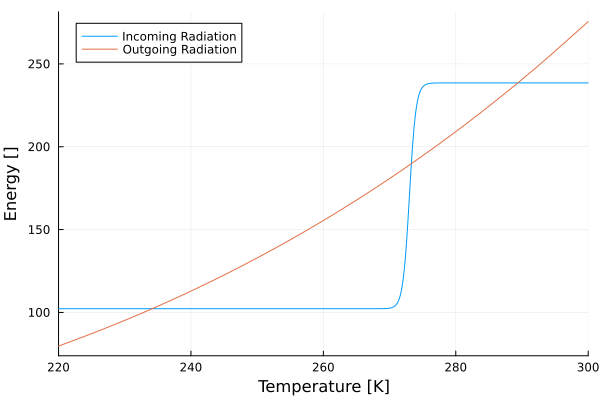

In [11]:
E_in(T; S₀=1363) = (1-α(T))*(S₀/4)
E_out(T; ϵ=0.6, σ=5.67e-8) = ϵ*σ*T^4
plot(E_in, xlims=[220,300], xlabel="Temperature [K]", ylabel="Energy []", label="Incoming Radiation")
plot!(E_out, xlims=[220,300], xlabel="Temperature [K]", ylabel="Energy []", label="Outgoing Radiation")

Our new model has three fixed points! 

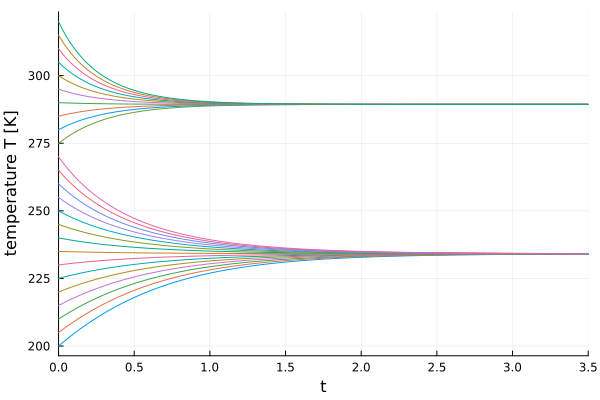

In [12]:
function zero_d_ebm_albedo(u,p,t) 
    S₀, = p
    return [E_in(u[1],S₀=S₀) - E_out(u[1])]
end 

p = [1363]
u0 = [273.]
prob = ODEProblem(zero_d_ebm_albedo, u0, (0.,3.5),p)
u0s = 200:5:320

fig = plot(0,0,xlabel="time",ylabel="temperature T [K]", legend=nothing)
for u0 ∈ u0s 
    plot!(fig, solve(remake(prob;u0=[u0])),label=nothing)
end 
fig

We see the two stable fixed point. An unstable fixed point is their basin boundary. 

* One fixed point at "normal" temperatures $\approx 290K$, one fixed point at very low temperatures
* The lower fixed point corresponds to a version of Earth that is completely frozen over, the *Snowball Earth*

#### Bifurcations 

The solar radition $S_0$ varies over long time scales

* the shape of the Earth’s orbit (eccentricity)
* the angle between the Earth’s rotational axis and the orbital plane
(obliquity)
* the direction the Earth’s rotational axis is pointing (precession)

These effects together constitute the *Milankovic cycles*. They are a crucial part why ice ages occur. 

Therefore, $S_0$ is our control / bifurcation parameter.

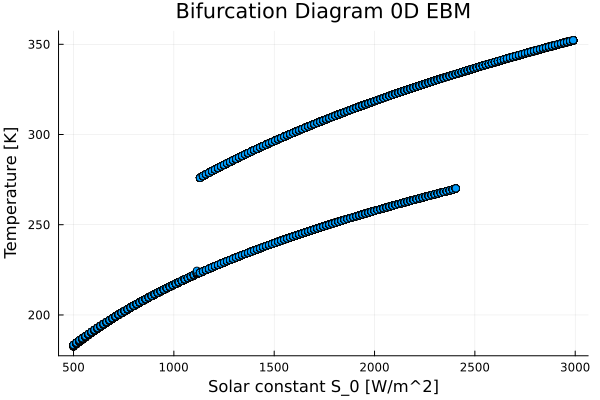

In [13]:
S = 500:15:3000
u0s = 200:2:400

bif_diagram = zeros(length(S)*length(u0s),2)
count = 1
for iS ∈ S
    for u0 ∈ u0s 
        bif_diagram[count, 1] = iS
        bif_diagram[count, 2] = solve(remake(prob,p=[iS],u0=[u0],tspan=(0.,5.)))[end][1]
        count += 1 
    end 
end 
scatter(bif_diagram[:,1],bif_diagram[:,2],legend=nothing, xlabel="Solar constant S_0 [W/m^2]", ylabel="Temperature [K]", title="Bifurcation Diagram 0D EBM")

* Snowball Earth is not a regular ice age. In regular ice ages Earth is not completely covered in snow/ice. There is however evidence that the Earth was in a Snowball Earth state 650 Million years ago. After the last complete glaciation multicellular life appeared on Earth. 
* More complex Earth system models also exhibit a similar global stability landscape, they might even have more unstable states in between the stable solutions, [Melancholia states](https://iopscience.iop.org/article/10.1088/1361-6544/ab86cc/meta)
* Climate is a multistable systems, there is no threat of the Earth returning to a Snowball Earth in the next million years, but local climate system can exhibit multistability as well. Tipping elements are part a complex comprehensive stability landscape and are usually similarly the result of competing feedback effects. For the global stability of the EBMs the ice-albedo feedback is crucial, local climate systems have other feedback mechanisms

## Atmospheric Modelling with SpeedyWeather.jl

* So far, we have an energy balance model, but the climate is more than just the average temperature
* We will now look a little bit into an actual general circulation model that we plan to use in climate models
* [SpeedyWeather.jl](https://github.com/SpeedyWeather/SpeedyWeather.jl) also solves the Navier-Stokes equation, but know we actually intend to model atmopsheric dynamics on Earth with it

### The Primitive Equations 

The [primitive equations](https://en.wikipedia.org/wiki/Primitive_equations) are a hydrostatic approximation
of the compressible Navier-Stokes equations for an ideal gas on a rotating sphere. We largely follow
the idealised spectral dynamical core developed by [^GFDL1](https://www.gfdl.noaa.gov/idealized-models-with-spectral-dynamics/)

Instead of directly solving for the velocites $\mathbf{u} = (u, v)$, we again look at other properties of the wind field (similar to the streamfunction for the Lorenz model). In this case we solve for the relative vorticity $\zeta = \nabla \times \mathbf{u}$ and the divergence $\mathcal{D} = \nabla \cdot \mathbf{u}$. 

The primitive equations solved by SpeedyWeather.jl for relative vorticity $\zeta$, divergence $\mathcal{D}$,
logarithm of surface pressure $\ln p_s$, temperature $T$ and specific humidity $q$ are

\begin{aligned}
\frac{\partial \zeta}{\partial t} &= \nabla \times (\mathbf{\mathcal{P}}_\mathbf{u}
+ (f+\zeta)\mathbf{u}_\perp - W(\mathbf{u}) - R_dT_v\nabla \ln p_s) \\
\frac{\partial \mathcal{D}}{\partial t} &= \nabla \cdot (\mathcal{P}_\mathbf{u}
+ (f+\zeta)\mathbf{u}_\perp - W(\mathbf{u}) - R_dT_v\nabla \ln p_s) - \nabla^2(\frac{1}{2}(u^2 + v^2) + \Phi) \\
\frac{\partial \ln p_s}{\partial t} &= -\frac{1}{p_s} \nabla \cdot \int_0^{p_s} \mathbf{u}~dp \\
\frac{\partial T}{\partial t} &= \mathcal{P}_T -\nabla\cdot(\mathbf{u}T) + T\mathcal{D} - W(T) + \kappa T_v \frac{D \ln p}{Dt} \\
\frac{\partial q}{\partial t} &= \mathcal{P}_q -\nabla\cdot(\mathbf{u}q) + q\mathcal{D} - W(q)\\
\end{aligned}


with velocity $\mathbf{u} = (u, v)$, rotated velocity $\mathbf{u}_\perp = (v, -u)$,
Coriolis parameter $f$, $W$ the vertical advection operator, dry air gas constant $R_d$,
virtual temperature $T_v$, Geopotential $\Phi$, pressure $p$
and surface pressure $p_s$, thermodynamic $\kappa = R_d/c_p$
with $c_p$ the heat capacity at constant pressure. 

The primitive equations are the _dynamical core_ of our model. The parameterizations for the tendencies of $u, v, T, q$ from physical processes are denoted as
$\mathcal{P}_\mathbf{u} = (\mathcal{P}_u, \mathcal{P}_v), \mathcal{P}_T, \mathcal{P}_q$. These parameterizations model all influences that are not directly part of the fluid dynamics: e.g. the interactions with the surface and ocean, radiation (like in the EBMs) and dynamics that are happening on smaller scales than our model resolution. This seperation of the model into a dynamical core and parametrizations is very typical for most Earth system model components. 



### Spherical Harmonics 

In order to solve this PDE, we actually transform all variables into a spectral space, more concretely into the space of the spherical harmonics. Similar to a Fourier transform, the spherical harmonics form a basis of functions on the surface of a sphere

The [spherical harmonics](https://en.wikipedia.org/wiki/Spherical_harmonics) $Y_{lm}$ of degree $l$ and order $m$
over the longitude $\phi = (0, 2\pi)$ and colatitudes $\theta = (-\pi/2, \pi/2)$, are

\begin{aligned}
Y_{lm}(\phi, \theta) = \lambda_l^m(\sin\theta) e^{im\phi}
\end{aligned}

with $\lambda_l^m$ being the pre-normalized associated Legendre polynomials, and $e^{im\phi}$ are the
complex exponentials (the Fourier modes). 

<img src="https://upload.wikimedia.org/wikipedia/commons/1/12/Rotating_spherical_harmonics.gif">

Starting in grid-point space we can transform a field $f(\lambda, \theta)$ into the spectral space of the spherical harmonics by

\begin{aligned}
a_{l, m} = \int_0^{2\pi} \int_{0}^\pi f(\phi, \theta) Y_{l, m}(\phi, \theta) \sin \theta d\theta d\phi
\end{aligned}

The synthesis (or inverse transform) takes the spectral coefficients $a_{lm}$ and transforms them to grid-point values
$f(\phi, \theta)$: 

\begin{aligned}
f(\phi, \theta) = \sum_{l=0}^{\infty} \sum_{m=-l}^l a_{lm} Y_{lm}(\phi, \theta)
\end{aligned}

We obtain an approximation with a finite set of $a_{l, m}$ by truncating the series in both degree $l$
and order $m$ somehow. 

The reason why we do this is transform is because many operations are very simple to perform in this spectral space. E.g. to take the Laplace operator and meridional gradients take the form 

\begin{aligned}
    \Delta a_{l, m} &= \frac{-l(l+1)}{R^2} a_{l, m}\\
    \partial_\lambda  a_{l, m} &= \frac{im}{R} a_{l, m}, 
\end{aligned}

this makes it therefore much easier to solve the primitive equation. 

### Running SpeedyWeather 

But now, let's actually look how to run it: 

In [24]:
using SpeedyWeather 
spectral_grid = SpectralGrid()

SpectralGrid:
├ Spectral:   T31 LowerTriangularMatrix{Complex{Float32}}, radius = 6.371e6 m
├ Grid:       48-ring OctahedralGaussianGrid{Float32}, 3168 grid points
├ Resolution: 401km (average)
├ Vertical:   8-layer atmosphere, 2-layer land
└ Device:     CPU using Array

This returns all information about the discritazation. Based on this we actually choose which model we want to run (there's barotropic, shallow water and primtitive equation models available): 

In [28]:
model = PrimitiveWetModel(spectral_grid)

PrimitiveWetModel <: PrimitiveWet
├ spectral_grid: SpectralGrid
├ device_setup: SpeedyWeather.DeviceSetup{CPU, DataType}
├ dynamics: Bool
├ geometry: Geometry{Float32, OctahedralGaussianGrid, Vector{Float32}, Vector{Float64}}
├ planet: Earth{Float32}
├ atmosphere: EarthAtmosphere{Float32}
├ coriolis: Coriolis{Float32, Vector{Float32}}
├ geopotential: Geopotential{Float32, Vector{Float32}}
├ adiabatic_conversion: AdiabaticConversion{Float32, Vector{Float32}}
├ particle_advection: NoParticleAdvection
├ initial_conditions: InitialConditions{ZonalWind, PressureOnOrography, JablonowskiTemperature, ConstantRelativeHumidity}
├ forcing: NoForcing
├ drag: NoDrag
├ random_process: NoRandomProcess
├ tracers: Dict{Symbol, Tracer}
├ orography: EarthOrography{Float32, OctahedralGaussianGrid{Float32}, LowerTriangularMatrix{ComplexF32}}
├ land_sea_mask: EarthLandSeaMask{Float32, OctahedralGaussianGrid{Float32}}
├ ocean: SeasonalOceanClimatology{Float32, OctahedralGaussianArray{Float32, 2, Matrix{Float

Then, we initialize the simulation. This means we precompute a lot of computations for the actual integration.  

In [18]:
simulation = SpeedyWeather.initialize!(model)

Simulation{PrimitiveWetModel}
├ prognostic_variables::PrognosticVariables{...}
├ diagnostic_variables::DiagnosticVariables{...}
└ model::PrimitiveWetModel{...}

Now we can actually run it. 

In [29]:
run!(simulation, period=Day(100), output=true)

Weather is speedy: run 0002 100%|█████████| Time: 0:00:19 (1230.20 years/day)


                      Surface relative vorticity [1/s]                     
       ┌────────────────────────────────────────────────────────────┐ 6e⁻⁵ 
    90 │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ ┌──┐ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
    ˚N │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄│ │▄▄│ 
       │▄▄▄▄

This saves the output in a NetCDF file. NetCDF (.nc) is a typical dataformat for geospatial data. We can easily inspect it with the command line tool `ncview`. NetCDF can also be opened `NCDatasets.jl`